# To build a model for training and testing

In [1]:
import os
import numpy as np # linear algebra
import matplotlib.pyplot as plt

In [2]:
# Dl framwork - tensorflow, keras a backend 
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, BatchNormalization 
from tensorflow.keras.layers import Conv2D, SeparableConv2D, MaxPool2D, LeakyReLU, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from IPython.display import display
from os import listdir
from os.path import isfile, join
from PIL import Image
import glob
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
dir_name_train_Lung_adenocarcinoma = 'dataset/Train/Lung_adenocarcinoma'
dir_name_train_Lung_benign_tissue = 'dataset/Train/Lung_benign_tissue'
dir_name_train_Lung_squamous_cell_carcinoma = 'dataset/Train/Lung_squamous_cell_carcinoma'

In [5]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(7, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()

In [6]:
def Images_details_Print_data(data, path):
    print(" ====== Images in: ", path)    
    for k, v in data.items():               #using for ;oop we are printing the each key and values
        print("%s:\t%s" % (k, v))

def Images_details(path):
    files = [f for f in glob.glob(path + "**/*.*", recursive=True)] #using for loop we are taking all images name(not images) and store it in a variable files
    data = {}                                        # {}implies dictionary-contains keys & values .creating an empty dictionary.
    data['images_count'] = len(files)  # len counts how many images names are there in files variable
    data['min_width'] = 10**100  # No image will be bigger than that
    data['max_width'] = 0
    data['min_height'] = 10**100  # No image will be bigger than that
    data['max_height'] = 0
                            # it contains 5 keys and 5 values and it stored in dict called data

    for f in files:
        im = Image.open(f) #using the image name opening that image
        width, height = im.size
        data['min_width'] = min(width, data['min_width'])
        data['max_width'] = max(width, data['max_height'])
        data['min_height'] = min(height, data['min_height'])
        data['max_height'] = max(height, data['max_height'])

    Images_details_Print_data(data, path)


Trainned data for Lung Adenocarcinoma: 

 ====== Images in:  dataset/Train/Lung_adenocarcinoma
images_count:	300
min_width:	768
max_width:	768
min_height:	768
max_height:	768



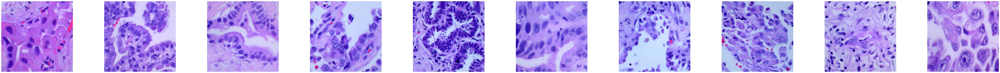

In [7]:
print("")
print("Trainned data for Lung Adenocarcinoma: ")
print("")
Images_details(dir_name_train_Lung_adenocarcinoma)
print("")
plot_images(dir_name_train_Lung_adenocarcinoma, 10)


Trainned data for Lung Benign Tissue: 

 ====== Images in:  dataset/Train/Lung_benign_tissue
images_count:	301
min_width:	768
max_width:	768
min_height:	768
max_height:	768



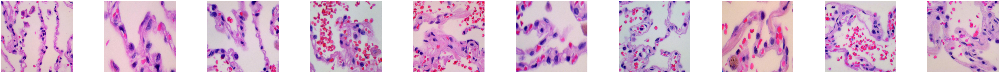


Trainned data for Lung Squamous Cell Carcinoma: 

 ====== Images in:  dataset/Train/Lung_squamous_cell_carcinoma
images_count:	300
min_width:	768
max_width:	768
min_height:	768
max_height:	768



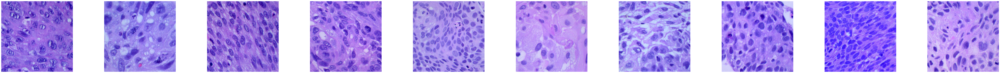

In [9]:
print("")
print("Trainned data for Lung Squamous Cell Carcinoma: ")
print("")
Images_details(dir_name_train_Lung_squamous_cell_carcinoma)
print("")
plot_images(dir_name_train_Lung_squamous_cell_carcinoma, 10)

In [10]:
Classifier=Sequential()   # classifier is the nme of the architecture
Classifier.add(Convolution2D(32,(3,3),input_shape=(250,250,3),activation='relu'))
Classifier.add(MaxPooling2D(pool_size=(2,2)))
Classifier.add(Flatten())        # to change 2D to 1D for better understanding of ANN(column vector)
Classifier.add(Dense(38, activation='relu'))       # contains 38 neurons. all 38 values is passed to 38 neurons. and activation is performed to change the neg.to pos

In [11]:
Classifier.add(Dense(3, activation='softmax')) #here the dense is 3, since it contains 3 category. so all the 38 neurons is connected to 3. so here all 38 values is passed to softmax and it is substituted in that formula, and cal is done and that output value is the neuron value. if the value=11 then it belongs to category-1 if val=4 it belongs to cat=2 and so on..... if val is not in these 3(value=11.2) the it goes for simmilarity the nearby value
Classifier.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy','Precision','Recall']) # after building the arch. we need to compile it.optimizer is used to reduce the loss. there are many types of optimizer. to reduce the loss we need to cal the loss there is a function called categorical cross entropy (since we are use 3). if it 2 we use binary cross entopy.inside the metrics we are giving the accuracy. 

In [12]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)  # used to preprocess the images.1 st rescale RGB range is 0-255 here we are changing 0 to 1. shear range cutting outer 20% (top,bottom,left,right).zoom range zooming it for 20%. fliping it to horizontal.(we didn't say where's the data) but if images comes store it in a variable
test_datagen=ImageDataGenerator(rescale=1./255) # here only rescale

In [13]:
training_set=train_datagen.flow_from_directory('dataset/Train',target_size=(250,250),batch_size=32,class_mode='categorical') #taking the all images (3 category) from the path dataset/train and telling the machine to do training_datagen. and store it in a variable. so these images is processed and ready for training. 
test_set=test_datagen.flow_from_directory('dataset/Test',target_size=(250,250),batch_size=32,class_mode='categorical') # take all images which in the path dataset/test and do test_datagen only rescale. store it ina variable. so these images ready for testing.

Found 901 images belonging to 3 classes.
Found 150 images belonging to 3 classes.


In [14]:
epochs = 90       # epochs is how many times the machines wants to undertand. here 10 times so 10 times all 901 images are learning.
batch_size = 32  # batch size while learning thge machine needs to learn 32 images at a time. 1st 32 images comes and then next 32 batch by batch

In [15]:
from keras.callbacks import ModelCheckpoint

In [16]:
mc = ModelCheckpoint('Manual.h5', monitor='accuracy', save_best_only=True, verbose=1)

In [17]:
#### Fitting the model
history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size, callbacks=mc) # fit means train. 1st we need to train which is ready after preprocessed.epochs 10=10. validation data is test data which is ready after preprocessing.
                                                                                # training loss and training accuracy. it automatically takes data randonmly for testing that is call val-loss and val-accuracy
#all these values are stored in history(loss,acc,val_loss,val_acc) 

Epoch 1/90
28/28 [==============================] - 33s 1s/step - loss: 5.7521 - accuracy: 0.5029 - precision: 0.5120 - recall: 0.4891 - val_loss: 0.6198 - val_accuracy: 0.6641 - val_precision: 0.6641 - val_recall: 0.6641

Epoch 00001: accuracy improved from -inf to 0.50288, saving model to Manual.h5
Epoch 2/90
28/28 [==============================] - 32s 1s/step - loss: 0.5153 - accuracy: 0.7319 - precision: 0.7341 - recall: 0.7181 - val_loss: 0.4648 - val_accuracy: 0.7734 - val_precision: 0.7795 - val_recall: 0.7734

Epoch 00002: accuracy improved from 0.50288 to 0.73188, saving model to Manual.h5
Epoch 3/90
28/28 [==============================] - 28s 1s/step - loss: 0.3560 - accuracy: 0.8481 - precision: 0.8515 - recall: 0.8446 - val_loss: 0.2683 - val_accuracy: 0.9062 - val_precision: 0.9062 - val_recall: 0.9062

Epoch 00003: accuracy improved from 0.73188 to 0.84810, saving model to Manual.h5
Epoch 4/90
28/28 [==============================] - 27s 971ms/step - loss: 0.3145 - accu

28/28 [==============================] - 25s 902ms/step - loss: 0.3181 - accuracy: 0.8861 - precision: 0.8859 - recall: 0.8849 - val_loss: 0.2478 - val_accuracy: 0.8828 - val_precision: 0.8828 - val_recall: 0.8828

Epoch 00029: accuracy did not improve from 0.94246
Epoch 30/90
28/28 [==============================] - 25s 901ms/step - loss: 0.2149 - accuracy: 0.9171 - precision: 0.9181 - recall: 0.9160 - val_loss: 0.2207 - val_accuracy: 0.9062 - val_precision: 0.9062 - val_recall: 0.9062

Epoch 00030: accuracy did not improve from 0.94246
Epoch 31/90
28/28 [==============================] - 25s 891ms/step - loss: 0.2128 - accuracy: 0.8987 - precision: 0.9007 - recall: 0.8976 - val_loss: 0.2917 - val_accuracy: 0.8672 - val_precision: 0.8672 - val_recall: 0.8672

Epoch 00031: accuracy did not improve from 0.94246
Epoch 32/90
28/28 [==============================] - 26s 925ms/step - loss: 0.1679 - accuracy: 0.9333 - precision: 0.9353 - recall: 0.9321 - val_loss: 0.2119 - val_accuracy: 0.89

Epoch 58/90
28/28 [==============================] - 28s 994ms/step - loss: 0.0750 - accuracy: 0.9701 - precision: 0.9701 - recall: 0.9701 - val_loss: 0.2134 - val_accuracy: 0.9062 - val_precision: 0.9206 - val_recall: 0.9062

Epoch 00058: accuracy did not improve from 0.97814
Epoch 59/90
28/28 [==============================] - 29s 1s/step - loss: 0.1670 - accuracy: 0.9413 - precision: 0.9413 - recall: 0.9413 - val_loss: 0.3143 - val_accuracy: 0.8984 - val_precision: 0.8984 - val_recall: 0.8984

Epoch 00059: accuracy did not improve from 0.97814
Epoch 60/90
28/28 [==============================] - 27s 956ms/step - loss: 0.0978 - accuracy: 0.9712 - precision: 0.9724 - recall: 0.9712 - val_loss: 0.2163 - val_accuracy: 0.9219 - val_precision: 0.9219 - val_recall: 0.9219

Epoch 00060: accuracy did not improve from 0.97814
Epoch 61/90
28/28 [==============================] - 26s 941ms/step - loss: 0.0676 - accuracy: 0.9747 - precision: 0.9747 - recall: 0.9735 - val_loss: 0.1985 - val_accur

In [18]:
print("[INFO] Calculating model accuracy")
loss = Classifier.evaluate(test_set)
print ("\n\n================================\n\n")
print ("Loss: {}".format(loss))

[INFO] Calculating model accuracy
5/5 [==============================] - 2s 355ms/step - loss: 0.2554 - accuracy: 0.9267 - precision: 0.9267 - recall: 0.9267




Loss: [0.255428284406662, 0.9266666769981384, 0.9266666769981384, 0.9266666769981384]


In [19]:
print("[INFO] Calculating model accuracy")
scores = Classifier.evaluate(test_set)
print(f"Test Accuracy: {scores[1]*100}")

[INFO] Calculating model accuracy
5/5 [==============================] - 2s 349ms/step - loss: 0.2554 - accuracy: 0.9267 - precision: 0.9267 - recall: 0.9267
Test Accuracy: 92.66666769981384


In [20]:
def graph():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])  # from the history var take the accuracy history
    plt.plot(history.history['val_accuracy'])  # from the history var take the val_accuracy history 
        
    plt.title('Model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left') # represents which graph is train and test
    plt.show()

    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    
    plt.title('Model loss')
    plt.ylabel('loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

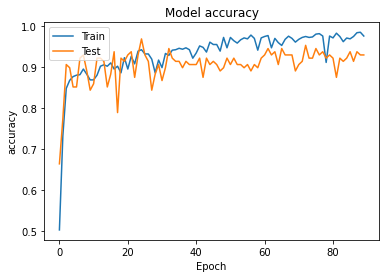

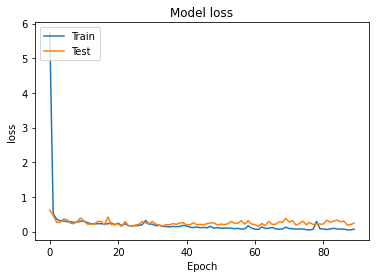

In [21]:
graph()

In [22]:
def graph():
    #Plot training & validation accuracy values
    plt.plot(history.history['precision'])  # from the history var take the accuracy history
    plt.plot(history.history['val_precision'])  # from the history var take the val_accuracy history    
        
    plt.title('Model precision')
    plt.ylabel('precision')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left') # represents which graph is train and test
    plt.show()

    # Plot training & validation loss values
    plt.plot(history.history['recall'])
    plt.plot(history.history['val_recall'])
        
    plt.title('Model recall')
    plt.ylabel('recall')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

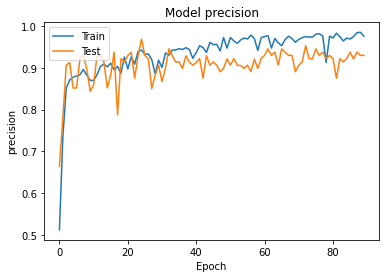

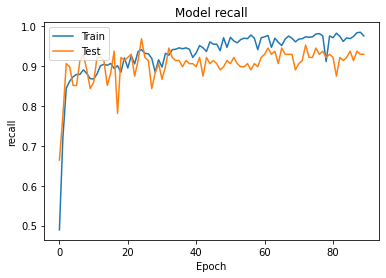

In [23]:
graph()

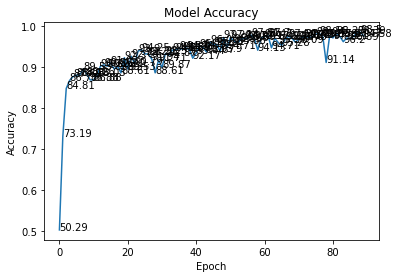

In [24]:
plt.plot(history.history['accuracy'])

for i in range(epochs):
    plt.annotate(str(np.round(history.history['accuracy'][i]*100,2)), xy=(i, history.history['accuracy'][i]))

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.show()

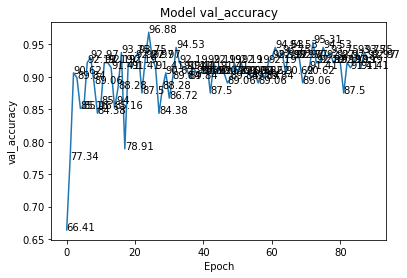

In [25]:
plt.plot(history.history['val_accuracy'])

for i in range(epochs):
    plt.annotate(str(np.round(history.history['val_accuracy'][i]*100,2)), xy=(i, history.history['val_accuracy'][i]))

plt.title('Model val_accuracy')
plt.ylabel('val_accuracy')
plt.xlabel('Epoch')
plt.show()

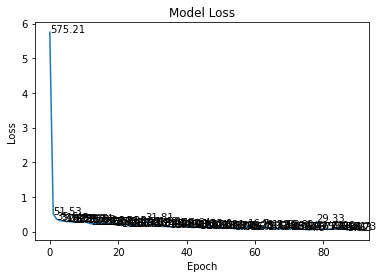

In [26]:
plt.plot(history.history['loss'])

for i in range(epochs):
    plt.annotate(str(np.round(history.history['loss'][i]*100,2)), xy=(i, history.history['loss'][i]))

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()

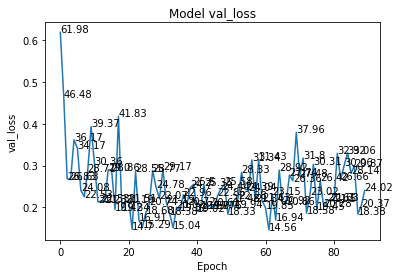

In [27]:
plt.plot(history.history['val_loss'])

for i in range(epochs):
    plt.annotate(str(np.round(history.history['val_loss'][i]*100,2)), xy=(i, history.history['val_loss'][i]))

plt.title('Model val_loss')
plt.ylabel('val_loss')
plt.xlabel('Epoch')
plt.show()

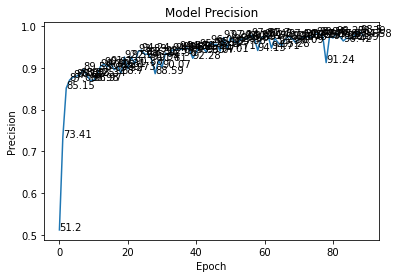

In [28]:
plt.plot(history.history['precision'])

for i in range(epochs):
    plt.annotate(str(np.round(history.history['precision'][i]*100,2)), xy=(i, history.history['precision'][i]))

plt.title('Model Precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.show()

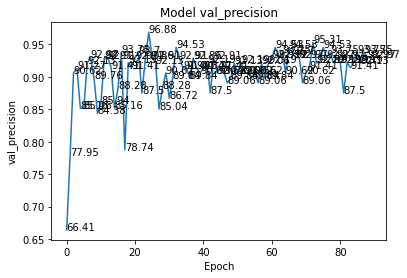

In [29]:
plt.plot(history.history['val_precision'])

for i in range(epochs):
    plt.annotate(str(np.round(history.history['val_precision'][i]*100,2)), xy=(i, history.history['val_precision'][i]))

plt.title('Model val_precision')
plt.ylabel('val_precision')
plt.xlabel('Epoch')
plt.show()

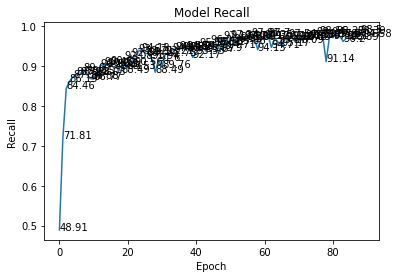

In [30]:
plt.plot(history.history['recall'])

for i in range(epochs):
    plt.annotate(str(np.round(history.history['recall'][i]*100,2)), xy=(i, history.history['recall'][i]))

plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.show()

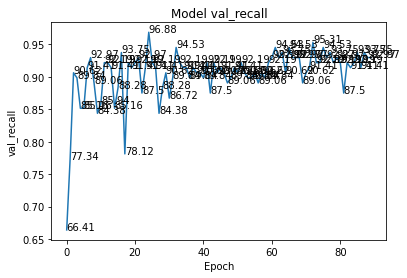

In [31]:
plt.plot(history.history['val_recall'])

for i in range(epochs):
    plt.annotate(str(np.round(history.history['val_recall'][i]*100,2)), xy=(i, history.history['val_recall'][i]))

plt.title('Model val_recall')
plt.ylabel('val_recall')
plt.xlabel('Epoch')
plt.show()